### Import packages

In [35]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
import torch
import numpy as np
import os
from tqdm import tqdm
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
from datasets import load_dataset,DatasetDict,load_from_disk
from torch.utils.data import DataLoader
import torch.nn.functional as F
from itertools import islice
import copy
from torchmetrics.retrieval import RetrievalMAP, RetrievalPrecision
import os
import random
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import Subset, DataLoader




### Set seed

In [36]:
torch.manual_seed(0)

### Set device

In [37]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
    
device

'mps'

### Define main path

In [38]:
main_path = '/Users/aakashagarwal/Downloads/ir_assignment2/'

### Dataset

#### Load dataset

In [39]:
ds = load_dataset("uoft-cs/cifar10")
ds

DatasetDict({
    train: Dataset({
        features: ['img', 'label'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label'],
        num_rows: 10000
    })
})

### Model load

In [40]:
processor = AutoImageProcessor.from_pretrained("google/vit-large-patch32-384",use_fast=True)
model = AutoModelForImageClassification.from_pretrained("google/vit-large-patch32-384")
model.to(device)
print()

### Extract features of training data

#### Feature function

#### Create features of train data or load from saved file.

In [41]:
model.eval()

transform = transforms.Compose([
        transforms.Resize((384, 384)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

# Define a function to process and extract features from each image
def extract_features(batch):
    imgs = batch['img']  # This will now be a list of images in a batch

    # Preprocess each image in the batch
    img_tensors = [transform(img).unsqueeze(0).to(device) for img in imgs]  # Add batch dimension and move to device
    img_tensors = torch.cat(img_tensors, dim=0)  # Concatenate to create a batch tensor

    inputs = {'pixel_values': img_tensors}  # Adjust for model input (assuming using Hugging Face models)

    # Forward pass through the model to get features
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)

    hidden_states = outputs.hidden_states  # List of all hidden states

    # Extract the final hidden state
    final_hidden_state = hidden_states[-1]  # Shape: [batch_size, num_patches, hidden_size]
    
    # Optionally, pool the features
    pooled_features = final_hidden_state.mean(dim=1)  # Shape: [batch_size, hidden_size]
    
    # Return the features as a new column for the batch
    return {"features": pooled_features.cpu().numpy()}  # 


In [42]:

output_dir = main_path+ "features/cifar10/"
os.makedirs(output_dir, exist_ok=True)
output_file = os.path.join(output_dir, "vit_large/")  # Saving in Arrow format

# Check if features already exist
if os.path.exists(output_file):
    print(f"Features file already exists at {output_file}. Loading features...")
    # Load existing features
    ds_feature = load_from_disk(output_file)
else:
    print("Features file does not exist. Extracting features...")

    # Use `map` to apply the feature extraction across the entire dataset
    ds_feature = ds.map(extract_features, batched=True, batch_size=64)

    # Save the dataset with the new features to disk
    ds_feature.save_to_disk(output_file)  # Saving in the Arrow format
    print("Features saved successfully!")

Features file already exists at /Users/aakashagarwal/Downloads/ir_assignment2/features/cifar10/vit_large/. Loading features...


In [43]:
ds_feature

DatasetDict({
    train: Dataset({
        features: ['img', 'label', 'features'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label', 'features'],
        num_rows: 10000
    })
})

#### adding index to dataset

In [44]:
dataset_dict = DatasetDict({
    'train': ds_feature['train'],  # Your original train dataset
    'test': ds_feature['test']     # Your original test dataset
})

# Add index column to the train and test datasets
def add_index(example, idx):
    example['index'] = idx
    return example

# Apply the map function to add the 'index' column
ds_feature['train'] = dataset_dict['train'].map(add_index, with_indices=True)
ds_feature['test'] = dataset_dict['test'].map(add_index, with_indices=True)

In [45]:
ds_feature['test'][27]['index']

27

### Dataloader

#### Collate function

In [46]:
def custom_collate(batch):
    # Define the transformations you want to apply to the images
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
    ])

    # Extracting each field from the batch
    index = [item['index'] for item in batch]
    images = [transform(item['img']) for item in batch]  # Load and transform images
    labels = torch.tensor([item['label'] for item in batch])          # Convert labels to a tensor
    features = [torch.tensor(item['features']) for item in batch]     # Convert features to tensors
    
    # Return a dictionary with batched data
    return {
        'index': index,
        'img': torch.stack(images),    # Stack image tensors into a single tensor
        'label': labels,
        'features': torch.stack(features),  # Stack feature tensors into a single tensor
    }


In [47]:
def random_collate(batch):
    # Define the transformations you want to apply to the images
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
    ])

    # Extracting each field from the batch
    index = [item['index'] for item in batch]
    images = [transform(item['img']) for item in batch]  # Load and transform images
    labels = torch.tensor([item['label'] for item in batch])          # Convert labels to a tensor
    features = [torch.tensor(item['features']) for item in batch]     # Convert features to tensors
    
    # Return a dictionary with batched data
    return {
        'index': index,
        'img': torch.stack(images),    # Stack image tensors into a single tensor
        'label': labels,
        'features': torch.stack(features),  # Stack feature tensors into a single tensor
    }



#### Dataloading


In [83]:
# Total number of training samples
n_train = len(ds_feature['train'])

# Number of samples to take for q_loader
m = 500  # Specify the desired number of samples for q_loader

# Randomly select m unique indices from the training dataset
q_indices = random.sample(range(n_train), m)

# Create subsets for q_loader and x_dataloader
q_subset = Subset(ds_feature['train'], q_indices)
x_subset = Subset(ds_feature['train'], list(set(range(n_train)) - set(q_indices)))

# Create DataLoader instances
x_dataloader = DataLoader(x_subset, batch_size=64, drop_last=True,collate_fn=custom_collate)
q_dataloader = DataLoader(q_subset, batch_size=64, drop_last=True, collate_fn=custom_collate)
test_dataloader = DataLoader(ds_feature['test'], batch_size=64, drop_last=True, collate_fn=custom_collate)

In [55]:
for i,batch in enumerate(test_dataloader):
    if i ==19:
        print(batch['index'])
        break

[1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279]


#### Dataloader to random a random batch, shuffle=True

In [56]:
random_train_dataloader = DataLoader(
    ds_feature['train'], batch_size=64, shuffle=True, collate_fn=random_collate, pin_memory=True
)

### Get radom batch to sample negatives

In [57]:
from torch.utils.data import DataLoader

def get_random_batch():
    random_train_dataloader = DataLoader(
        ds_feature['train'], batch_size=64, shuffle=True, collate_fn=custom_collate, pin_memory=True
    )
    # Get the first batch from the DataLoader
    first_batch = next(iter(random_train_dataloader))
    return first_batch

### Create Hash Tables for training data

In [58]:
class phi_q_model(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(phi_q_model, self).__init__()
        
        self.network = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim)
        )
        
        # Apply Xavier initialization to each layer
        for layer in self.network:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)  # or nn.init.xavier_normal_(layer.weight)
                if layer.bias is not None:
                    nn.init.zeros_(layer.bias)  # Initialize biases to zero

    def forward(self, x):
        return self.network(x)




In [59]:
class phi_x_model(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(phi_x_model, self).__init__()
        
        self.network = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim)
        )
        
        # Apply Xavier initialization to each layer
        for layer in self.network:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)  # or nn.init.xavier_normal_(layer.weight)
                if layer.bias is not None:
                    nn.init.zeros_(layer.bias)  # Initialize biases to zero

    def forward(self, x):
        return self.network(x)


In [60]:
feature_dim = len(ds_feature['train'][0]['features'])
output_dim = 512
H = 16

In [61]:
# Step 2: Initialize the transformation networks (φ_q and φ_x)
phi_q = phi_q_model(feature_dim, output_dim).to(device)
phi_x = phi_x_model(feature_dim, output_dim).to(device)

In [62]:
print([param.is_leaf for param in phi_q.parameters()])  # Should all be True
print([param.is_leaf for param in phi_x.parameters()])  # Should all be True



[True, True, True, True, True, True, True, True, True, True]
[True, True, True, True, True, True, True, True, True, True]


### Loss

In [63]:
def cosine_similarity_loss(q_features, x_features, z_q_labels, z_x_labels, epsilon=1e-8):
    device = q_features.device
    z_q_labels = z_q_labels.to(device)
    z_x_labels = z_x_labels.to(device)

    # Calculate cosine similarity
    cos_sim = F.cosine_similarity(q_features.unsqueeze(1), x_features.unsqueeze(0), dim=2)

    # Relevance labels
    relevance_labels = (z_q_labels.unsqueeze(1) == z_x_labels.unsqueeze(0)).float()

    # Clamp values for log safety
    cos_sim = cos_sim.clamp(min=epsilon, max=1 - epsilon)

    # Compute the two terms of the loss function
    pos_loss = -relevance_labels * torch.log(cos_sim)
    neg_loss = -(1 - relevance_labels) * torch.log(1 - cos_sim)

    # Combine the losses and return the mean
    return torch.mean(pos_loss + neg_loss)


In [64]:
def collision_loss(z_q_features, z_q_labels, z_x_features, z_x_labels , W_hat):
    # Separate features and labels
    # Check if lengths of labels are equal

    # Use tanh(W z) as smooth surrogate for sign function
    z_q_proj = torch.tanh(z_q_features @ W_hat).T
    
    # Check for positive (matching labels) and negative (non-matching labels) pairs
    positive_mask = (z_q_labels == z_x_labels).float().unsqueeze(1)  # For broadcasting
    negative_mask = (z_q_labels != z_x_labels).float().unsqueeze(1)  # For broadcasting
    # print(torch.tanh(z_x_features @ W_hat).shape)
    # Calculate projections
    pos_proj = torch.tanh(z_x_features @ W_hat).T * positive_mask.T
    neg_proj = torch.tanh(z_x_features @ W_hat).T * negative_mask.T

    # Ranking loss: Encourages more overlap between query and positive than negative
    margin = 1
    pos_sim = (z_q_proj * pos_proj).sum(dim=1)
    neg_sim = (z_q_proj * neg_proj).sum(dim=1)

    # Mean margin-based ranking loss
    loss = torch.mean(torch.relu(margin + neg_sim - pos_sim))
    return loss

def fence_sitting_loss(z_x, W_hat):
    # Ensure all tensors are on the same device
    device = z_x.device
    z_x = z_x.to(device)  # Ensure z_x is on the same device
    # loss = torch.mean(torch.norm(torch.abs(torch.tanh(z_x @ W_hat).T) - 1,p=1 ,dim=1))
    loss = torch.mean(torch.norm(torch.abs(torch.tanh(z_x @ W_hat).T) - 1,p=2 ,dim=1)) 
    return loss

def bit_balance_loss(z_x, W_hat):
    # Ensure all tensors are on the same device
    device = z_x.device
    z_x = z_x.to(device)  # Ensure z_x is on the same device
    bit_counts = torch.sum(torch.tanh(z_x @ W_hat).T, dim=0)
    loss = torch.mean(torch.abs(bit_counts))
    return loss

def total_loss(z_q, z_x, W_hat, lambda1, lambda2, lambda3):
    # Ensure all tensors are on the same device
    device = z_x[0].device  # Using z_x_features for the device
    z_q_features, z_q_labels = z_q
    z_q_features = z_q_features.to(device)
    z_q_labels = z_q_labels.to(device)
    z_x_features, z_x_labels = z_x
    z_x_features = z_x_features.to(device)
    z_x_labels = z_x_labels.to(device)
    W_hat = W_hat.to(device)
    
    bit_balance = lambda1 * bit_balance_loss(z_x_features, W_hat)
    fence_sitting = lambda2 * fence_sitting_loss(z_x_features, W_hat)
    collision = lambda3 * collision_loss(z_q_features, z_q_labels ,z_x_features, z_x_labels, W_hat)
    loss = collision + fence_sitting + bit_balance
    
    return loss , collision , fence_sitting , bit_balance



In [101]:
def train(phi_q, phi_x, x_dataloader, q_dataloader, optimizer, num_epochs=10):
    phi_q.train()
    phi_x.train()
    
    for epoch in range(num_epochs):
        total_train_loss = 0
        # Create a progress bar for the current epoch
        progress_bar = tqdm(q_dataloader, desc=f"Epoch [{epoch + 1}/{num_epochs}]", leave=False)
        
        for q_batch in progress_bar:
            for x_batch in x_dataloader:
                query_features = q_batch['features'].to(device)
                corpus_features = x_batch['features'].to(device)

                # Get transformed features (z_q and z_x)
                z_q_features = phi_q(query_features)
                z_x_features = phi_x(corpus_features)
                z_q_labels = q_batch['label']
                z_x_labels = x_batch['label']

                loss = cosine_similarity_loss(z_q_features, z_x_features, z_q_labels, z_x_labels)

                # Backpropagation and optimization step
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_train_loss += loss.item()
                
            progress_bar.set_postfix({'loss': loss.item()})

        average_loss = total_train_loss / len(x_dataloader)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {average_loss:.4f}')

        # Save the models after every epoch with epoch number in filename
        model_save_path_q = f'phi_q_epoch_{epoch + 1}.pt'
        model_save_path_x = f'phi_x_epoch_{epoch + 1}.pt'

        torch.save(phi_q, model_save_path_q)
        torch.save(phi_x, model_save_path_x)

        print(f'Model phi_q saved to {model_save_path_q}')
        print(f'Model phi_x saved to {model_save_path_x}')


In [102]:
# Step 2: Initialize the transformation networks (φ_q and φ_x)
phi_q = phi_q_model(feature_dim, output_dim).to(device)
phi_x = phi_x_model(feature_dim, output_dim).to(device)

# Step 3: Define the trainable hyperplanes (W^) with tanh smoothing
W_hat = nn.Parameter(torch.empty(output_dim, H))
nn.init.xavier_uniform_(W_hat)  #

Parameter containing:
tensor([[-0.0186,  0.0899, -0.0635,  ...,  0.0424,  0.0316, -0.0074],
        [-0.0957,  0.0937,  0.1031,  ..., -0.0995,  0.0828,  0.0195],
        [ 0.0408,  0.0518, -0.0595,  ..., -0.0500, -0.0221,  0.0244],
        ...,
        [-0.0054,  0.0770,  0.0565,  ...,  0.0037,  0.0595,  0.0762],
        [ 0.0867,  0.0457,  0.0514,  ...,  0.0065, -0.0197,  0.0885],
        [ 0.0932, -0.0819,  0.0364,  ..., -0.0406, -0.0513,  0.0759]],
       requires_grad=True)

In [103]:
learning_rate = 1e-5
num_epochs = 3

In [106]:
optimizer = torch.optim.Adam(list(phi_q.parameters()) + list(phi_x.parameters()), lr=learning_rate, weight_decay=1e-4)
train(phi_q,phi_x,x_dataloader=x_dataloader,q_dataloader=q_dataloader, optimizer=optimizer, num_epochs=2)

KeyboardInterrupt: 

In [117]:
# Assuming phi_q and phi_x are your model instances
model_save_path_q = 'phi_q_epoch_5.pth'  # Define the path to save phi_q model
model_save_path_x = 'phi_x_epoch_5.pth'  # Define the path to save phi_x model

In [118]:
import torch

# Assuming these are your model definitions (replace with your actual model classes)
# phi_q_model and phi_x_model are model classes that you defined earlier.

# Initialize the models first
phi_q = phi_q_model(feature_dim, output_dim).to(device)
phi_x = phi_x_model(feature_dim, output_dim).to(device)

# Load the model weights
phi_q.load_state_dict(torch.load(model_save_path_q))  # load state dict for phi_q model
phi_x.load_state_dict(torch.load(model_save_path_x))  # load state dict for phi_x model

# If you're using GPU and want to make sure everything is moved to the appropriate device
# You already used `.to(device)`, so the models should now be on the correct device.


/var/folders/9x/cvl5gvjj3v31p6kyd5_lblgh0000gn/T/ipykernel_64217/3716827916.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  phi_q.load_state_dict(torch.load(model_save_

<All keys matched successfully>

In [125]:
import torch
from tqdm import tqdm

def train(phi_q, phi_x, W_hat, lambda1, lambda2, lambda3, x_dataloader, q_dataloader, optimizer, num_epochs=10):
    phi_q.train()
    phi_x.train()
    
    for epoch in range(num_epochs):
        total_train_loss = 0
        # Create a progress bar for the current epoch
        progress_bar = tqdm(q_dataloader, desc=f"Epoch [{epoch + 1}/{num_epochs}]", leave=False)
        
        for q_batch in progress_bar:
            for x_batch in x_dataloader:
                query_features = q_batch['features'].to(device)
                corpus_features = x_batch['features'].to(device)

                # Get transformed features (z_q and z_x)
                z_q_features = phi_q(query_features)
                z_x_features = phi_x(corpus_features)
                z_q_labels = q_batch['label']
                z_x_labels = x_batch['label']

                z_q = z_q_features, z_q_labels
                z_x = z_x_features, z_x_labels
                
                # Compute loss
                loss, collision, fence_sitting, bit_balance = total_loss(z_q, z_x, W_hat, lambda1=lambda1, lambda2=lambda2, lambda3=lambda3)

                # Backpropagation and optimization step
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_train_loss += loss.item()
                
                progress_bar.set_postfix({
                    'loss': loss.item(),
                    'balance_loss': bit_balance.item(),
                    'fence_loss': fence_sitting.item(),
                    'weak_loss': collision.item()
                })

        # Calculate the average loss for the epoch
        avg_loss = total_train_loss / len(x_dataloader)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}')
        
        # Save the W_hat parameters after every epoch
        torch.save(W_hat.data, f'W_hat_parameters_epoch_{epoch + 1}.pth')


In [131]:
learning_rate = 3e-6
num_epochs = 10
lambda1= 0.01
lambda2=0.01
lambda3 = 1-lambda1-lambda2
phi_q.eval()
phi_x.eval()

phi_x_model(
  (network): Sequential(
    (0): Linear(in_features=1024, out_features=1024, bias=True)
    (1): ReLU()
    (2): Linear(in_features=1024, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=256, bias=True)
    (5): ReLU()
    (6): Linear(in_features=256, out_features=128, bias=True)
    (7): ReLU()
    (8): Linear(in_features=128, out_features=512, bias=True)
  )
)

In [ ]:
optimizer = torch.optim.Adam([W_hat], lr=learning_rate, weight_decay=1e-4)
train(phi_q,phi_x,W_hat, lambda1, lambda2, lambda3,x_dataloader=x_dataloader,q_dataloader=q_dataloader, optimizer=optimizer, num_epochs=5)

In [133]:
torch.save(W_hat.data, 'W_hat_parameters.pth')

In [138]:
W_hat = torch.load('W_hat_parameters.pth', map_location=torch.device(device))

/var/folders/9x/cvl5gvjj3v31p6kyd5_lblgh0000gn/T/ipykernel_64217/736595380.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  W_hat = torch.load('W_hat_parameters.pth', map

In [139]:
for i,j in model.named_parameters():
    if i == 'loss_coefficients':
        print(j)

In [141]:
import random
import torch
from tqdm import tqdm

hash_dict_list = []
L = 5  # number of hash tables
J = 12  # number of bits to randomly sample from hash length
position_list = []

# Iterate through the dataset
for i in range(L):
    hash_dict = dict()
     # Randomly select J unique positions from the range of the hash_length
    random_positions = random.sample(range(H), J)
    position_list.append(random_positions)
    
    for batch_idx, data in enumerate(tqdm(x_dataloader, desc="Processing Batches")):
        
        # Extract features and compute hash code
        feature = data['features'].to(device)
        hash_value = phi_x(feature)@W_hat
        hash_code = torch.where(hash_value > 0, 1, 0)
        
        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        hash_code_list = hash_code.tolist()

       
        # Iterate through each image and label in the batch
        for j in range(len(hash_code_list)):
            # Create a unique key from the hash code of each image
            hash_code_key = [hash_code_list[j][pos] for pos in random_positions]
            hash_code_key = tuple(hash_code_key)
            # Initialize the list if this hash code key is not yet in the dictionary
            if hash_code_key not in hash_dict:
                hash_dict[hash_code_key] = []
            
            # Append the tuple (batch index, image index, label) to the list of this hash code key
            hash_dict[hash_code_key].append([data['index'][j], data['label'][j].item()])

    print(len(hash_dict.keys()))
    hash_dict_list.append(hash_dict)
    

# You now have a list of new hash tables with sampled bits, and a list of their corresponding positions


Processing Batches: 100%|██████████| 773/773 [00:32<00:00, 23.68it/s]


86


Processing Batches: 100%|██████████| 773/773 [00:32<00:00, 23.78it/s]


83


Processing Batches: 100%|██████████| 773/773 [00:33<00:00, 23.35it/s]


79


Processing Batches: 100%|██████████| 773/773 [00:33<00:00, 23.34it/s]


84


Processing Batches: 100%|██████████| 773/773 [00:32<00:00, 23.45it/s]

80


In [142]:
position_list

[[7, 5, 10, 15, 12, 11, 14, 2, 3, 8],
 [3, 5, 4, 8, 15, 0, 14, 2, 9, 7],
 [10, 7, 5, 15, 9, 0, 6, 14, 2, 12],
 [11, 3, 12, 10, 15, 14, 9, 13, 4, 2],
 [7, 10, 14, 15, 4, 11, 0, 5, 12, 13]]

#### Number of buckets in each hash table

In [143]:
for i,j in hash_dict_list[0].items():
    print(i,j[:5])
    break

(1, 0, 1, 1, 1, 1, 0, 0, 1, 1) [[0, 0], [2, 0], [29, 0], [48, 0], [52, 0]]


### Hash codes for test data

In [144]:
# Initialize a list to store similar images for each hyperplane
similar_images_list = []

# Iterate through each hyperplane
for i in range(L):
    # Create a dictionary to store similar images for this hyperplane
    similar_images = {}
    random_positions = position_list[i]
    # Process test data
    for batch_idx, data in enumerate(tqdm(test_dataloader, desc="Processing Test Batches")):
        feature = data['features'].to(device)
        

        # Compute hash values for the test data
        hash_value = phi_x(feature)@W_hat
        test_hash_code = torch.where(hash_value > 0, 1, 0)

        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        test_hash_code_list = test_hash_code.tolist()
        
        # Iterate through each test image
        for j in range(len(test_hash_code_list)):
            # Create a unique key from (batch_idx, i, label)
            test_key = (data['index'][j], data['label'][j].item())  # Convert tensor to tuple
            test_hash_code_key = [test_hash_code_list[j][pos] for pos in random_positions]
            # Create a unique key from the test hash code
            test_hash_code_key = tuple(test_hash_code_key)

            # Check if this hash code exists in the training hash dictionary
            if test_hash_code_key in hash_dict_list[i]:
                # Retrieve the corresponding images and their labels from the training hash dictionary
                similar_images[test_key] = hash_dict_list[i][test_hash_code_key]
            else:
                similar_images[test_key] = []

    # Store the similar images found for this hyperplane
    similar_images_list.append(similar_images)

# Now similar_images_list contains keys as (batch_idx, i, label) and values as similar images


Processing Test Batches: 100%|██████████| 156/156 [00:06<00:00, 23.67it/s]


In [145]:
for i,j in similar_images_list[0].items():
    print(j[:1])
    break

[[13, 3]]


### Create union of all hash list

In [146]:
# Initialize the dictionary to store similar images
similar_images_dict = {}

# Iterate through the similar_images_dict to populate similar_images_list
for i in similar_images_list:
    for j in tqdm(i.keys()):
        # Check if the key already exists in similar_images_list
        if j not in similar_images_list:
            similar_images_dict[j] = []  # Initialize the list if it doesn't exist

        similar_images_dict[j].extend(i[j])  # Deep copy of the elements

100%|██████████| 9984/9984 [00:00<00:00, 70359.50it/s]


In [148]:
# Initialize the dictionary to store similar images
unique_images_dict = {}

# Iterate through the similar_images_dict to populate unique_images_dict
for i, j in tqdm(similar_images_dict.items()):
    if i not in unique_images_dict:
        unique_images_dict[i] = []  # Initialize the list only if the key doesn't exist

    for k in j:
        if k not in unique_images_dict[i]:  # Check if 'k' is not already in the list
            unique_images_dict[i].append(k)  # Append 'k' to the list


100%|██████████| 9984/9984 [17:06<00:00,  9.73it/s] 


In [149]:
for k,(i,j) in enumerate(unique_images_dict.items()):
    print(j)
    if k==5:
        break

[[13, 3], [15, 3], [22, 3], [55, 3], [58, 3], [60, 3], [97, 3], [113, 3], [115, 3], [122, 3], [134, 5], [159, 3], [170, 3], [192, 3], [204, 3], [219, 3], [266, 3], [270, 3], [305, 3], [311, 3], [318, 3], [339, 3], [346, 3], [347, 3], [361, 3], [386, 3], [389, 3], [424, 3], [432, 3], [452, 3], [459, 3], [461, 3], [476, 3], [479, 3], [490, 3], [541, 3], [571, 3], [573, 3], [574, 3], [586, 3], [587, 3], [606, 3], [611, 3], [624, 3], [634, 3], [653, 3], [668, 3], [683, 3], [704, 3], [721, 3], [737, 3], [756, 3], [772, 3], [774, 3], [777, 3], [779, 3], [784, 3], [789, 3], [806, 3], [809, 3], [817, 3], [838, 3], [839, 3], [848, 3], [866, 3], [896, 3], [933, 3], [947, 3], [960, 3], [983, 3], [986, 3], [995, 3], [1013, 3], [1016, 3], [1022, 3], [1050, 3], [1065, 3], [1078, 3], [1081, 3], [1094, 3], [1103, 3], [1134, 3], [1136, 3], [1141, 3], [1148, 3], [1150, 3], [1161, 3], [1178, 3], [1179, 3], [1194, 3], [1198, 3], [1199, 3], [1204, 3], [1242, 3], [1254, 3], [1260, 3], [1261, 3], [1295, 3], 

In [150]:
# Process each key in similar_images_dict with tqdm
for key, similar_images in tqdm(unique_images_dict.items(), desc="Processing keys"):
    
    test_feature = torch.tensor(ds_feature['test'][key[0]]['features'])
    # Process each similar image for the current key with tqdm
    for i, image in tqdm(enumerate(similar_images), desc=f"Processing similar images for key {key[0]}", leave=False):
        # Assuming image is a list/tuple with at least four elements
        train_feature = torch.tensor(ds_feature['train'][image[0]]['features'])
        
        # Calculate cosine similarity and store it
        similarity_score = F.cosine_similarity(test_feature, train_feature, dim=0)
        image = list(image[:2])  # Make a copy to modify
        # Append the similarity score to the copied list
        image.append(similarity_score.item())
        
        # Update the original list in similar_images
        similar_images[i] = image[:3]
        

Processing keys: 100%|██████████| 9984/9984 [3:02:24<00:00,  1.10s/it]  


In [151]:
len(unique_images_dict.keys())

9984

### Evaluate

In [157]:
# Define functions to calculate Average Precision (AP) and Precision@K
def average_precision(predictions, targets):
    relevant_indices = (targets == 1).nonzero(as_tuple=True)[0]
    if len(relevant_indices) == 0:
        return 0.0

    precisions = []
    for i, idx in enumerate(relevant_indices, start=1):
        precision_at_i = (targets[:idx + 1].sum() / (idx + 1)).item()
        precisions.append(precision_at_i)

    return sum(precisions) / len(precisions)

def precision_at_k(predictions, targets, k):
    top_k_indices = torch.argsort(predictions, descending=True)[:k]
    top_k_relevant = targets[top_k_indices].sum().item()
    return top_k_relevant / k

# Prepare lists to store metric scores
map_scores = []
precision_10_scores = []
precision_50_scores = []

# Example: Iterate over your dataset to calculate metrics
for key, value in tqdm(unique_images_dict.items(), desc="Calculating metrics", total=len(similar_images_list)):
    if len(value) > 0:
        # Sort the values by similarity score (assuming v[4] is the similarity score)
        sorted_value = sorted(value, key=lambda x: x[-1], reverse=True)[:50]
        predictions = torch.tensor([v[2] for v in sorted_value])  # Similarity scores
        targets = torch.tensor([v[1] == key[1] for v in sorted_value], dtype=torch.float32)  # Relevance labels
        
        # Calculate Mean Average Precision for the current sample
        ap = average_precision(predictions, targets)
        map_scores.append(ap)
        
        # Calculate Precision@10 and Precision@50
        p10 = precision_at_k(predictions, targets, k=10)
        p50 = precision_at_k(predictions, targets, k=50)
        precision_10_scores.append(p10)
        precision_50_scores.append(p50)

# Calculate final average metrics
mean_avg_precision = sum(map_scores) / len(map_scores) if map_scores else 0.0
precision_10 = sum(precision_10_scores) / len(precision_10_scores) if precision_10_scores else 0.0
precision_50 = sum(precision_50_scores) / len(precision_50_scores) if precision_50_scores else 0.0

# Print results
print("Mean Average Precision (mAP):", mean_avg_precision)
print("Precision@10:", precision_10)
print("Precision@50:", precision_50)


Calculating metrics: 9984it [00:20, 498.15it/s]           

Mean Average Precision (mAP): 0.9633219885694009
Precision@10: 0.955283807194538
Precision@50: 0.9482380515642514


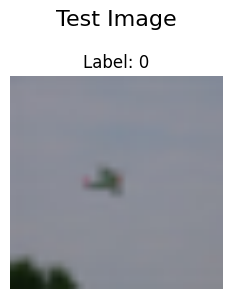

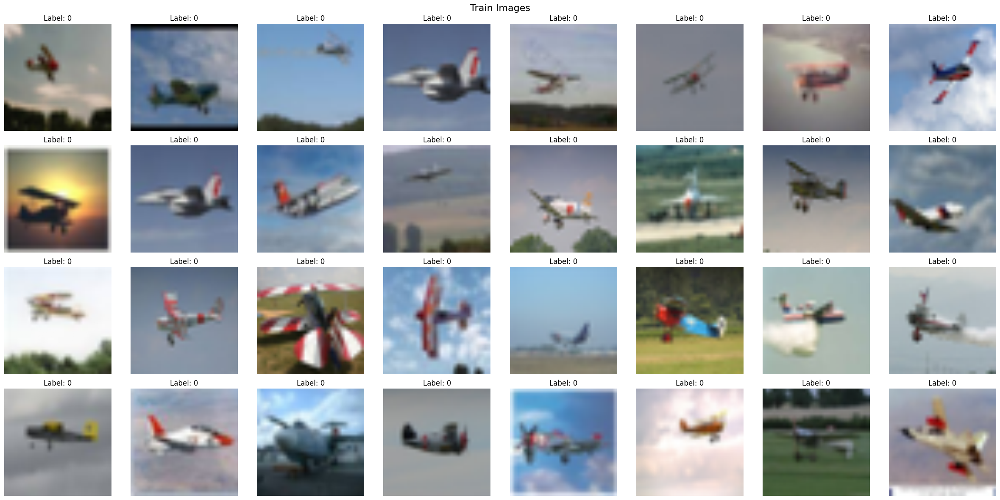

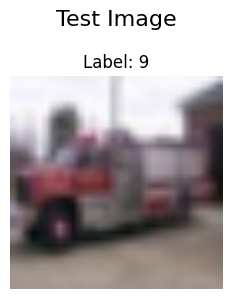

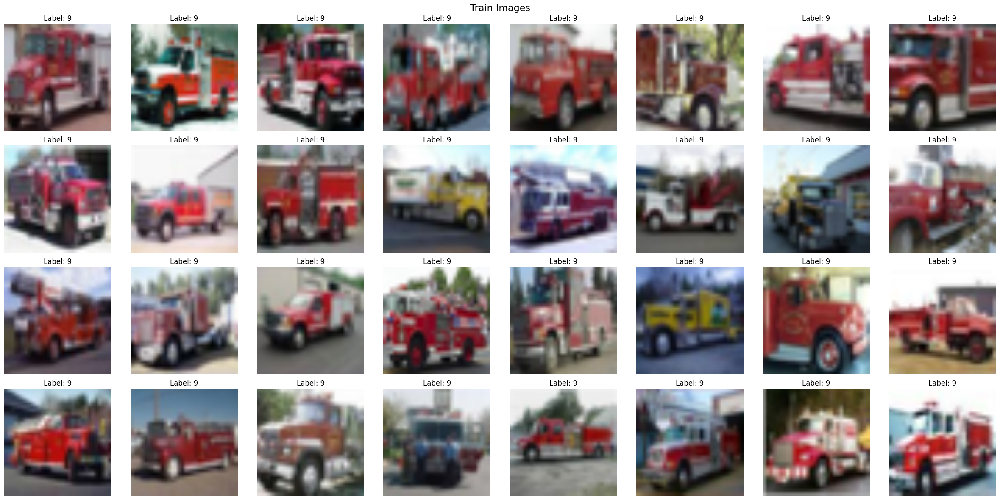

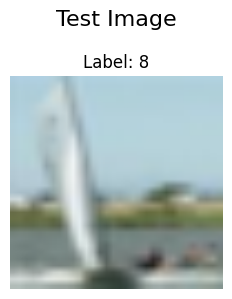

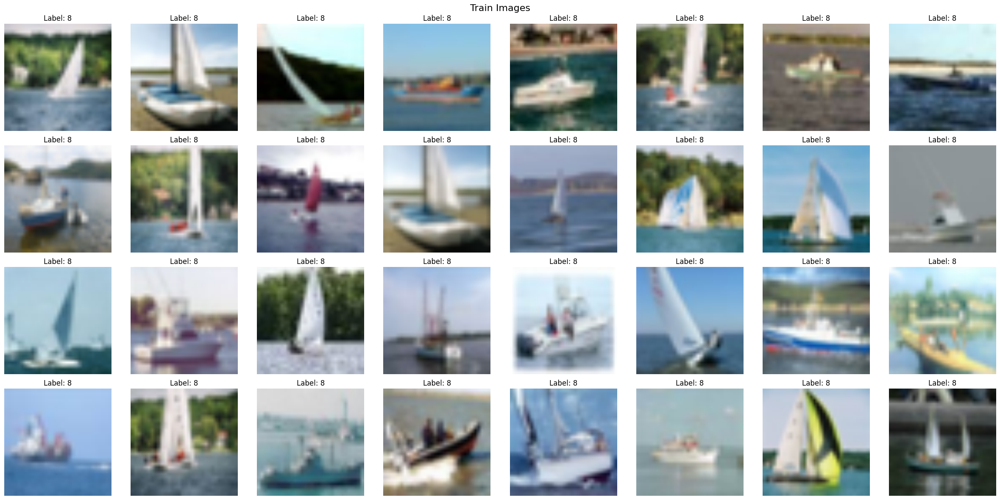

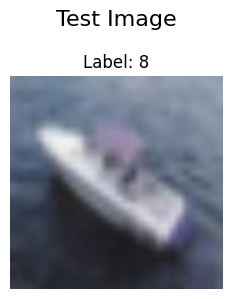

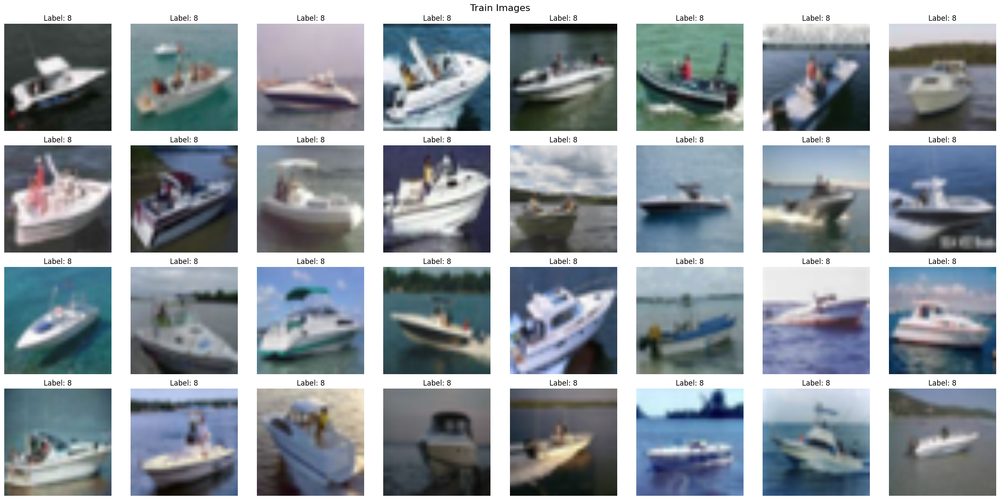

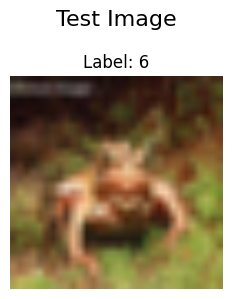

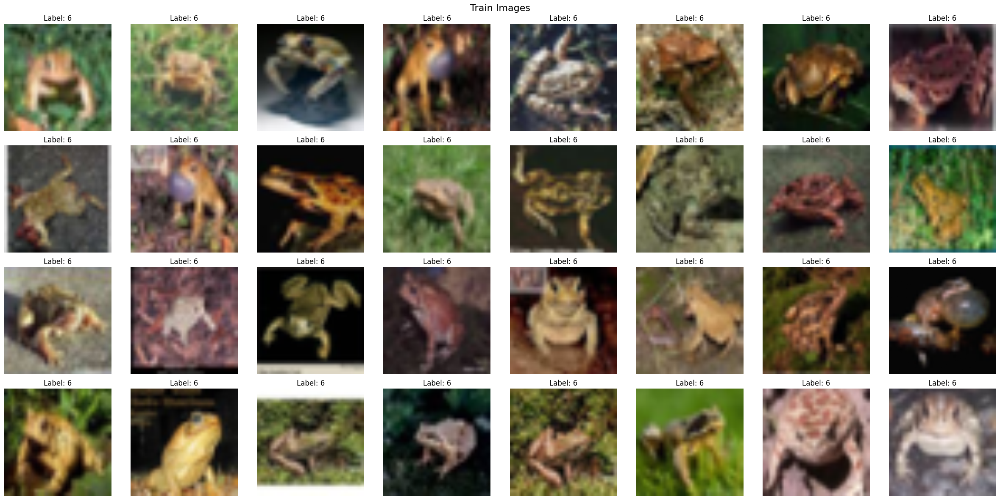

In [158]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a consistent size
    transforms.ToTensor(),          # Convert PIL images to tensors
])

# Function to display images in a grid
def show_images_grid(images, labels, rows=3, cols=4, title=None):
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    if title:
        fig.suptitle(title, fontsize=16)
    
    # Flatten axes if it’s a 2D array; otherwise, wrap it in a list for consistency
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (img, lbl) in enumerate(zip(images, labels)):
        if idx >= rows * cols:
            break
        ax = axes[idx]
        ax.imshow(img.permute(1, 2, 0))  # Convert CHW to HWC for display
        ax.set_title(f'Label: {lbl}')
        ax.axis('off')
    
    # Turn off any extra axes
    for ax in axes[len(images):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
random_choices = random.sample(range(0, len(ds_feature['test'])), 5)

# Get a batch of original images and labels
for c,(i, j) in enumerate(unique_images_dict.items()):
    top = sorted(j, key=lambda x: x[-1], reverse=True)[:32]
    if c in random_choices:
        test_image = transform(ds_feature['test'][i]['img'][0])
        test_label = ds_feature['test'][i]['label'][0]
        
        # Display the test image
        show_images_grid([test_image], [test_label], rows=1, cols=1, title='Test Image')
        
        # Get the train images and labels for the current test image
        train_images = [transform(ds_feature['train'][k]['img'][0]) for k in top]
        train_labels = [ds_feature['train'][k]['label'][0] for k in top]
        
        # Display the train images in a grid
        show_images_grid(train_images, train_labels, rows=4, cols=8, title='Train Images')
    
